In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_B1-4.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 29100 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 581 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

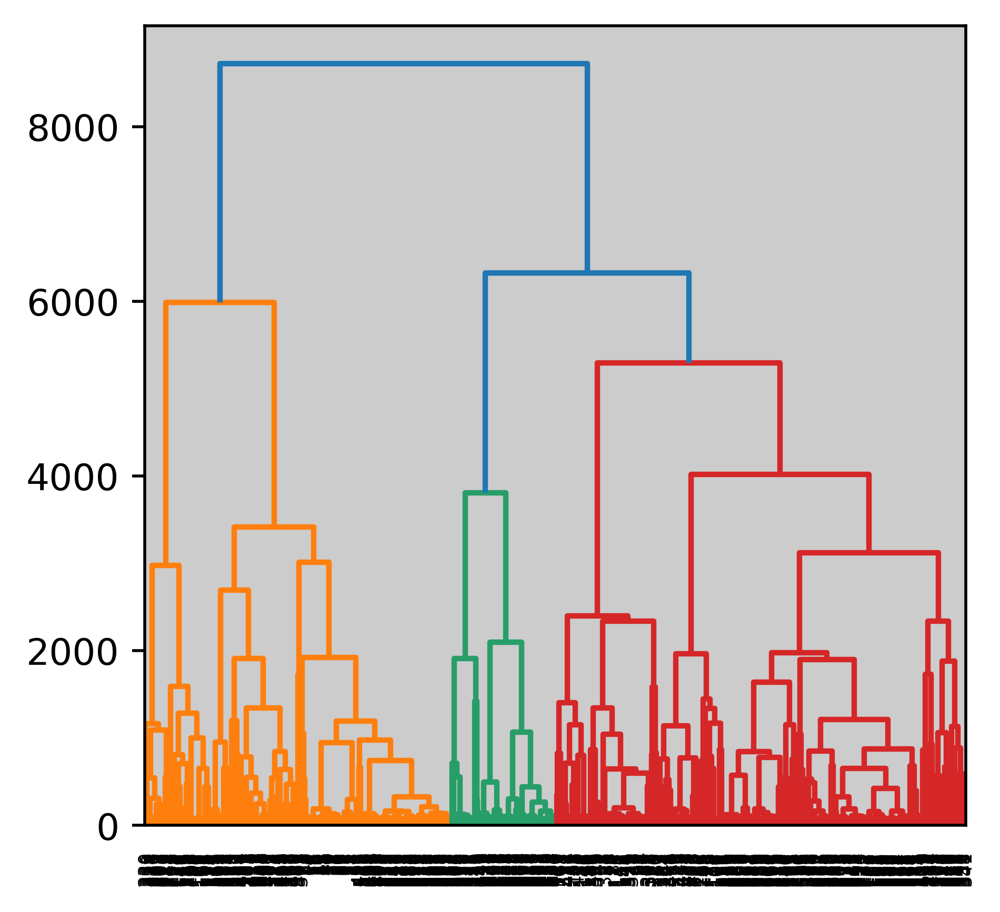

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 581 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=180, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[130 130 121 111 130 130 130 130 130   4 135  18  31  31  31  31  31  75
  31  31  31  75  75  75  75  75  75 140  31  31  31  31  75  75   0  31
  31  31  31  31  29  29 103   4   4  31  31  31  31   0  31  31  31  90
  31 142  94  29  29   4   4  15  15  15  97 155 130 130 130 130 130 130
 145 137 179 136 122 163  93 119  12  12   2 130 130 130 130 130  61  61
   2 175 139 107   2   2  20  20 108  20  20 141  20 115  51  51  32  32
  32  51  51  32  32  32  51  51 130 130 130 130  61  61  50  50  50  50
  50 151 101 116  99 116  33  69 116  58  33 116 116  58 167 130 130 130
 130  61  61  61  95  39  39  39  39  39 171 149  53  30  30  30  30  30
  30  30  30  30  30  30  30  17 159  91 127  30  30  30  30  30  30  30
  30  30  30  17 150  36 172 133  61  30  30  30  30  30  30  30  30  30
  17  17  17  17  38  38 165  84  84  17  17  17  17  38 105  84  84  84
  17  17  17  17 177  63  63  84  84  84  84 170  17  17 113  84  84  84
  84  84  17  26  26 125 131  84  84  84  84  84  8

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_2781676/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

18     50
30     31
130    29
57     26
31     25
       ..
93      1
92      1
91      1
89      1
179     1
Name: SMC_clusters, Length: 180, dtype: int64

In [17]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[18,
 30,
 130,
 57,
 31,
 84,
 17,
 8,
 64,
 4,
 72,
 82,
 14,
 59,
 75,
 13,
 61,
 35,
 28,
 32,
 40,
 51,
 29]

In [18]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [19]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [20]:
adata_aec_subset

AnnData object with n_obs × n_vars = 356 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [25]:
#del adata_aec_subset.uns['SMC_clusters_colors']

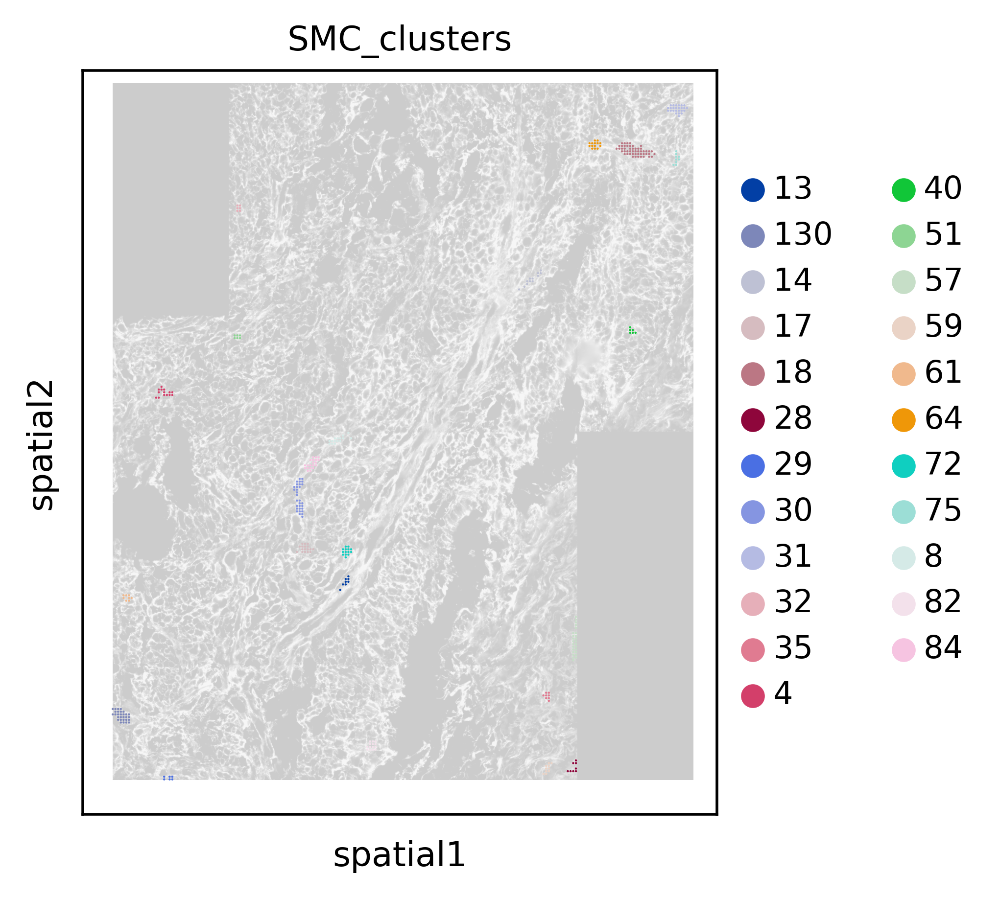

In [26]:
#180
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

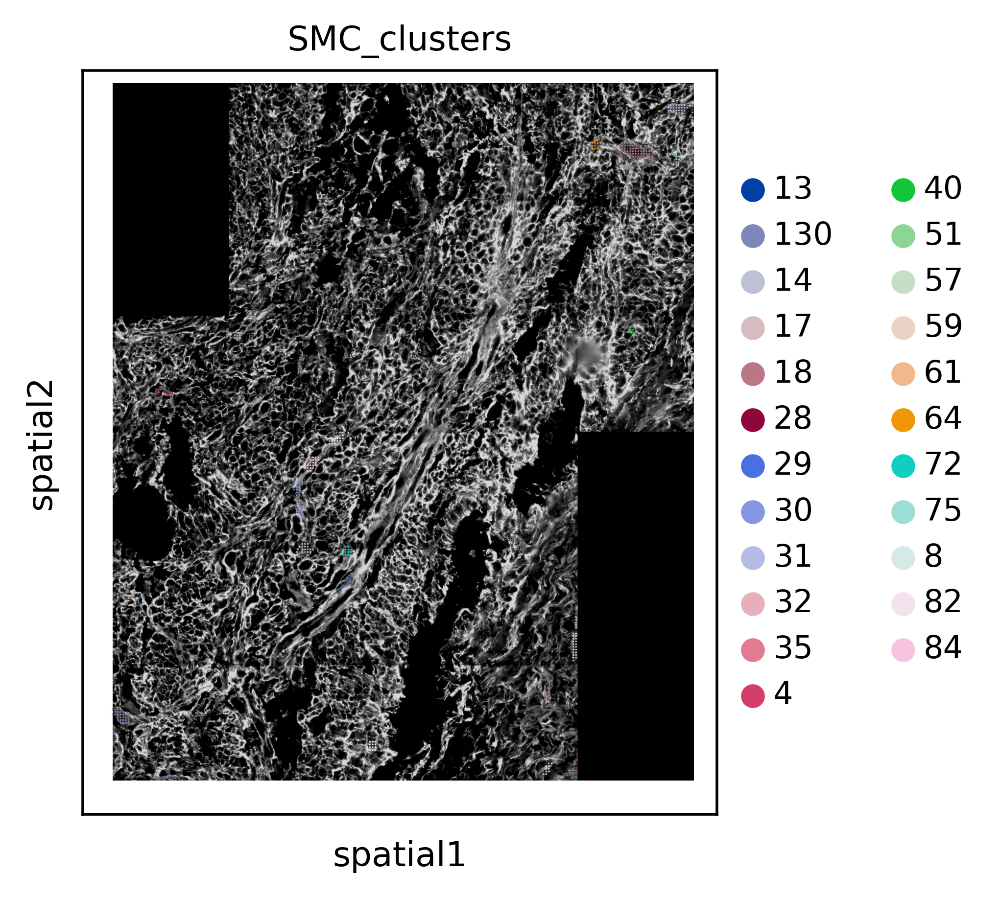

In [27]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

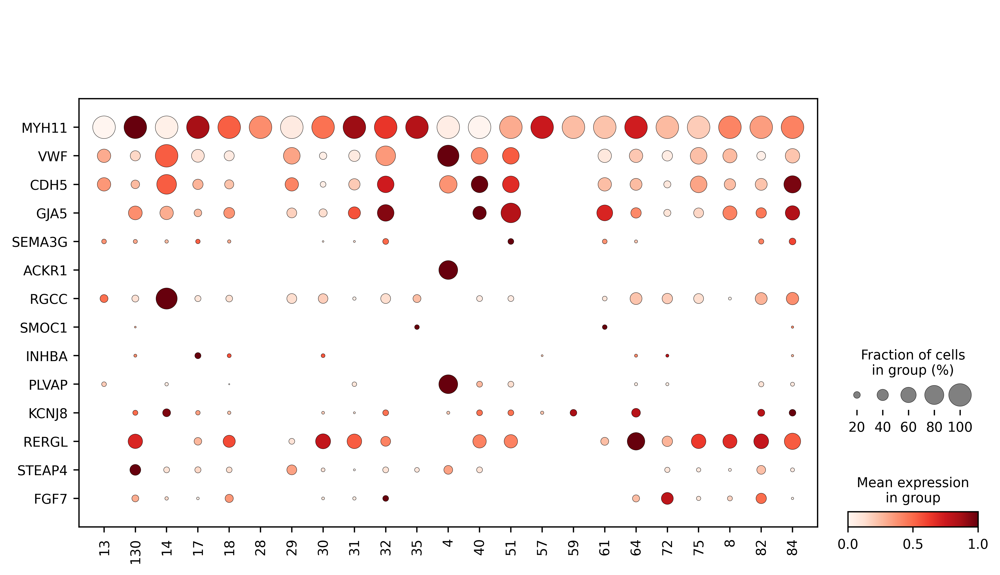

In [28]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [29]:
# add gene percentage expressed to dataframe

In [30]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [31]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [32]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [33]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [34]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [35]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [36]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [37]:
adata_aec_subset

AnnData object with n_obs × n_vars = 356 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [38]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [39]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0


In [40]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [41]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [42]:
matrix2 = matrix.replace(0, np.NaN)

In [43]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [44]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
13,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN
130,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0
14,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN
17,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN
18,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN
28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN
30,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN
31,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN


### add expression values to dataframe

In [45]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [46]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN


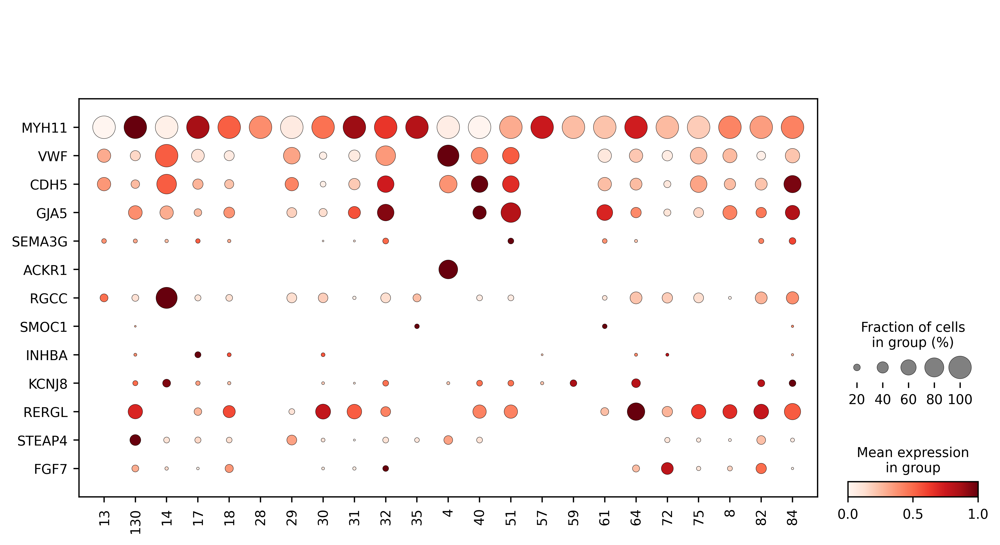

In [47]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [48]:
#add vessel type annotation column

In [53]:
test["Vessel"] = ['Unclear','Artery','Capillary','Artery','Artery','Unclear','Unclear','Artery','Artery','Artery','Unclear','Vein','Artery','Artery','Unclear','Unclear','Artery','Artery','Artery','Artery','Artery','Artery','Artery']

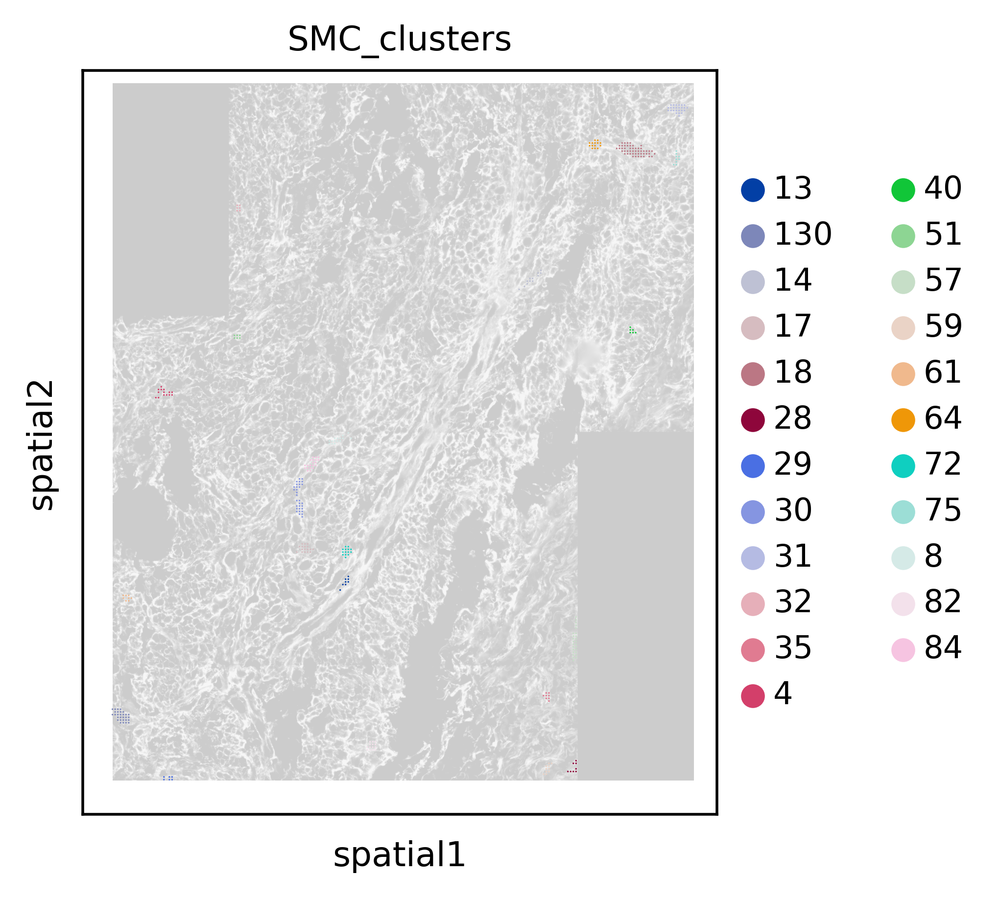

In [54]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2)

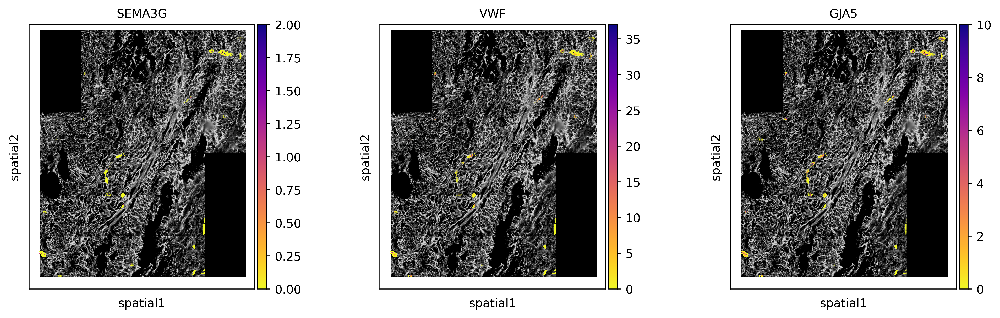

In [55]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5"],img_key='WGA',size=10, cmap = 'plasma_r')

In [56]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Artery
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery


### add vessel size numbers

In [57]:
adata_aec_subset.obs.SMC_clusters.value_counts()

18     50
30     31
130    29
57     26
31     25
84     20
17     17
8      15
82     14
72     14
64     14
4      14
14     12
59     10
75      9
35      8
61      8
28      8
13      8
40      6
51      6
32      6
29      6
Name: SMC_clusters, dtype: int64

In [58]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [59]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [60]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear,8
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery,29
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary,12
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Artery,17
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery,50
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,8
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear,6
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery,31
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery,25


In [61]:
group=pd.Series("Large", index=test2.index)

In [62]:
group[test2["size"] <= 30] = "Small"

In [63]:
group

SMC_clusters
13     Small
130    Small
14     Small
17     Small
18     Large
28     Small
29     Small
30     Large
31     Small
32     Small
35     Small
4      Small
40     Small
51     Small
57     Small
59     Small
61     Small
64     Small
72     Small
75     Small
8      Small
82     Small
84     Small
dtype: object

In [64]:
test2["group"] = group

In [65]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear,8,Small
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery,29,Small
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary,12,Small
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Artery,17,Small
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery,50,Large
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,8,Small
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear,6,Small
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery,31,Large
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery,25,Small


In [66]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [67]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear,8,Small,Unclear_Small
130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery,29,Small,Artery_Small
14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary,12,Small,Capillary_Small
17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Artery,17,Small,Artery_Small
18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery,50,Large,Artery_Large
28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,8,Small,Unclear_Small
29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear,6,Small,Unclear_Small
30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery,31,Large,Artery_Large
31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery,25,Small,Artery_Small


In [68]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [69]:
test2.index = ['ROI_B1-4_' + str(i) for i in test2.index.tolist()]

In [70]:
test2["ROI"] = "B1-4"

In [71]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_B1-4_13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear,8,Small,Unclear_Small,B1-4
ROI_B1-4_130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery,29,Small,Artery_Small,B1-4
ROI_B1-4_14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary,12,Small,Capillary_Small,B1-4
ROI_B1-4_17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Artery,17,Small,Artery_Small,B1-4
ROI_B1-4_18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery,50,Large,Artery_Large,B1-4
ROI_B1-4_28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,8,Small,Unclear_Small,B1-4
ROI_B1-4_29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear,6,Small,Unclear_Small,B1-4
ROI_B1-4_30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery,31,Large,Artery_Large,B1-4
ROI_B1-4_31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery,25,Small,Artery_Small,B1-4
ROI_B1-4_32,0.333333,0.166667,0.166667,0.166667,0.500000,0.000000,0.0,2.000000,1.000000,7.000000,1.666667,1.000000,1.00,NaN,1.000000,NaN,Artery,6,Small,Artery_Small,B1-4


[Text(0.5, 1.0, 'RERGL percentage expression')]

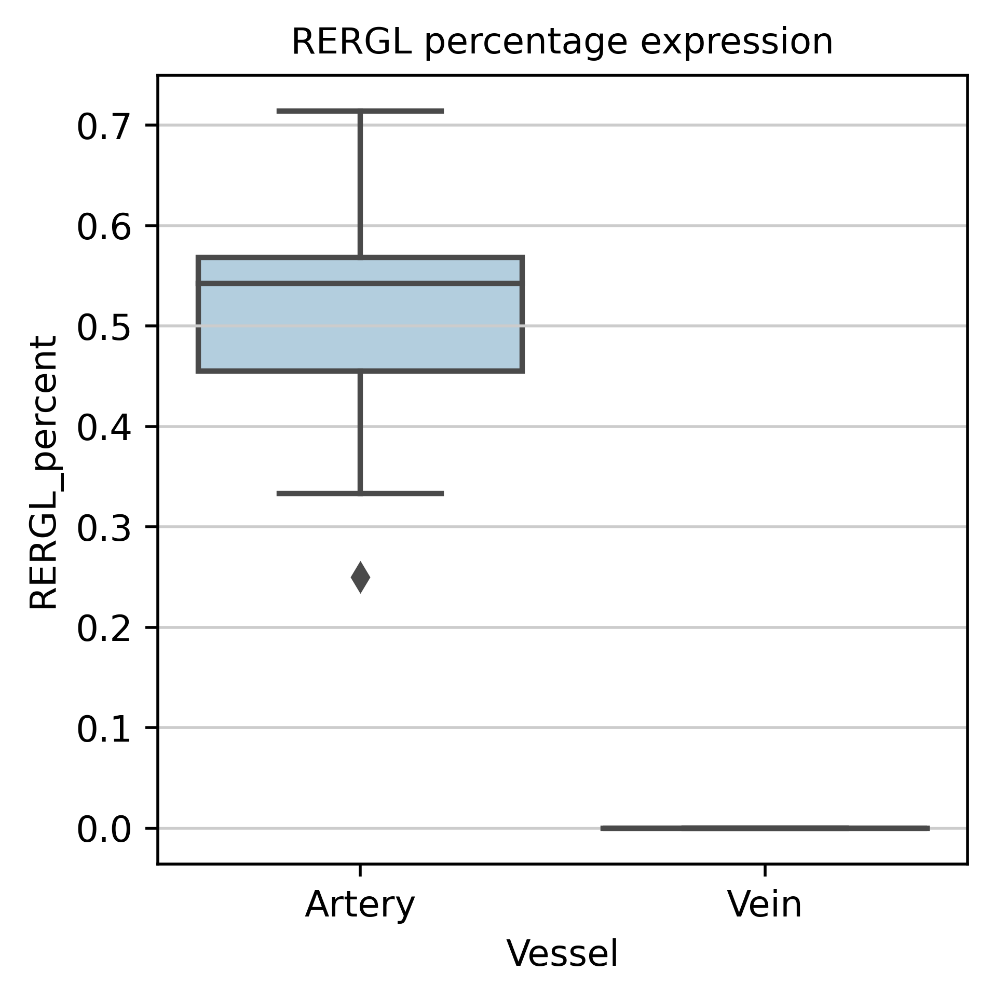

In [111]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

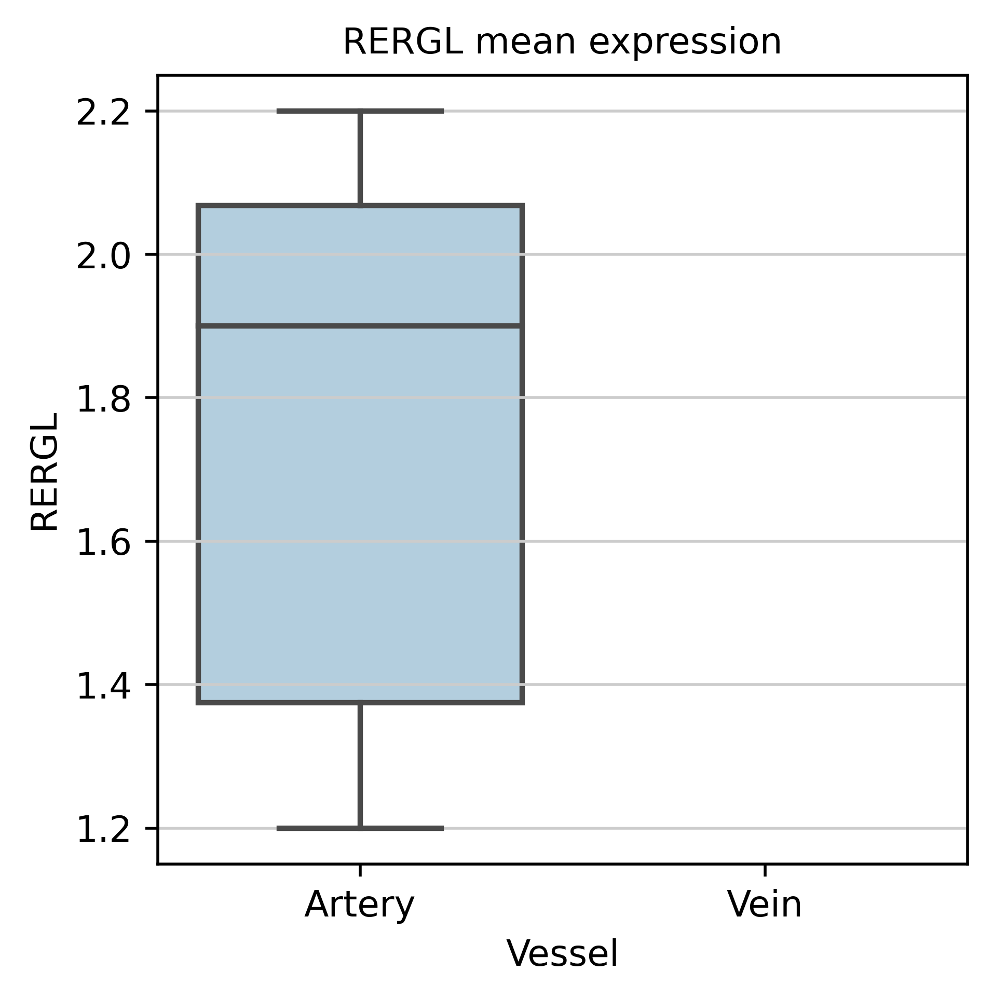

In [112]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

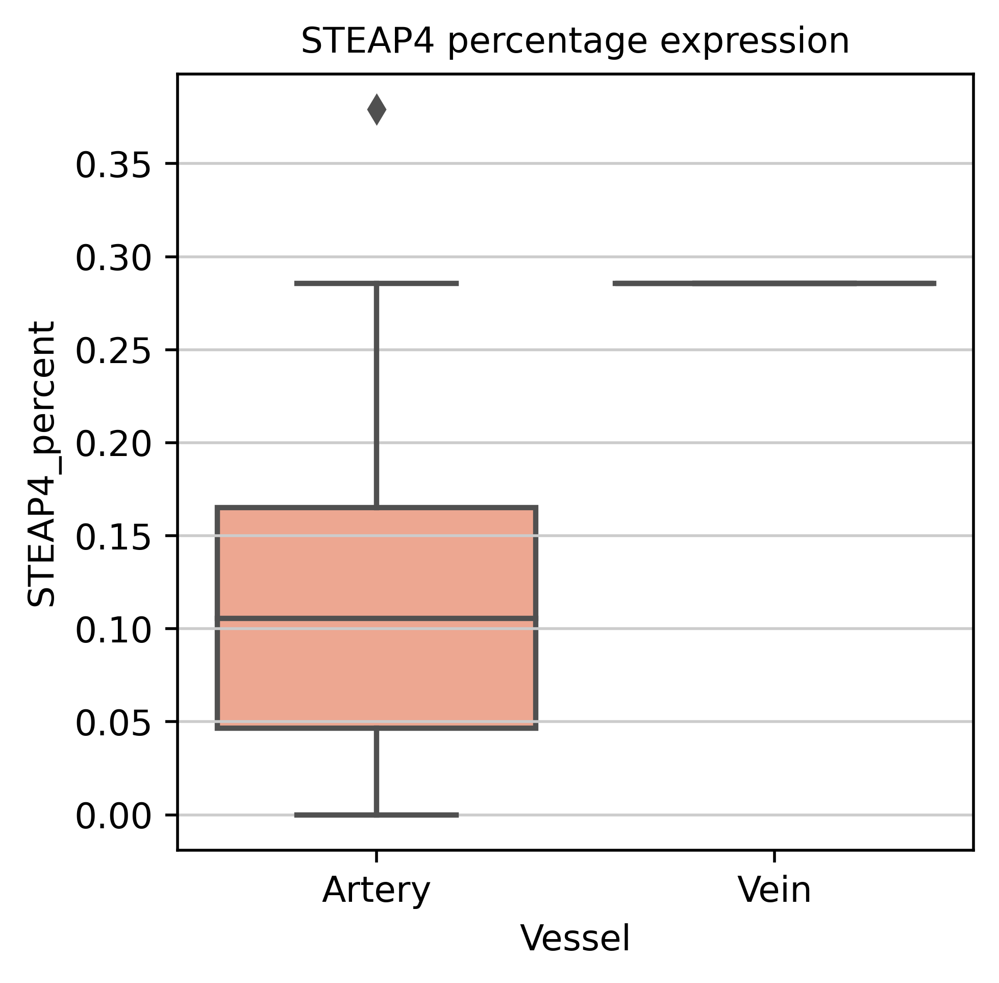

In [113]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

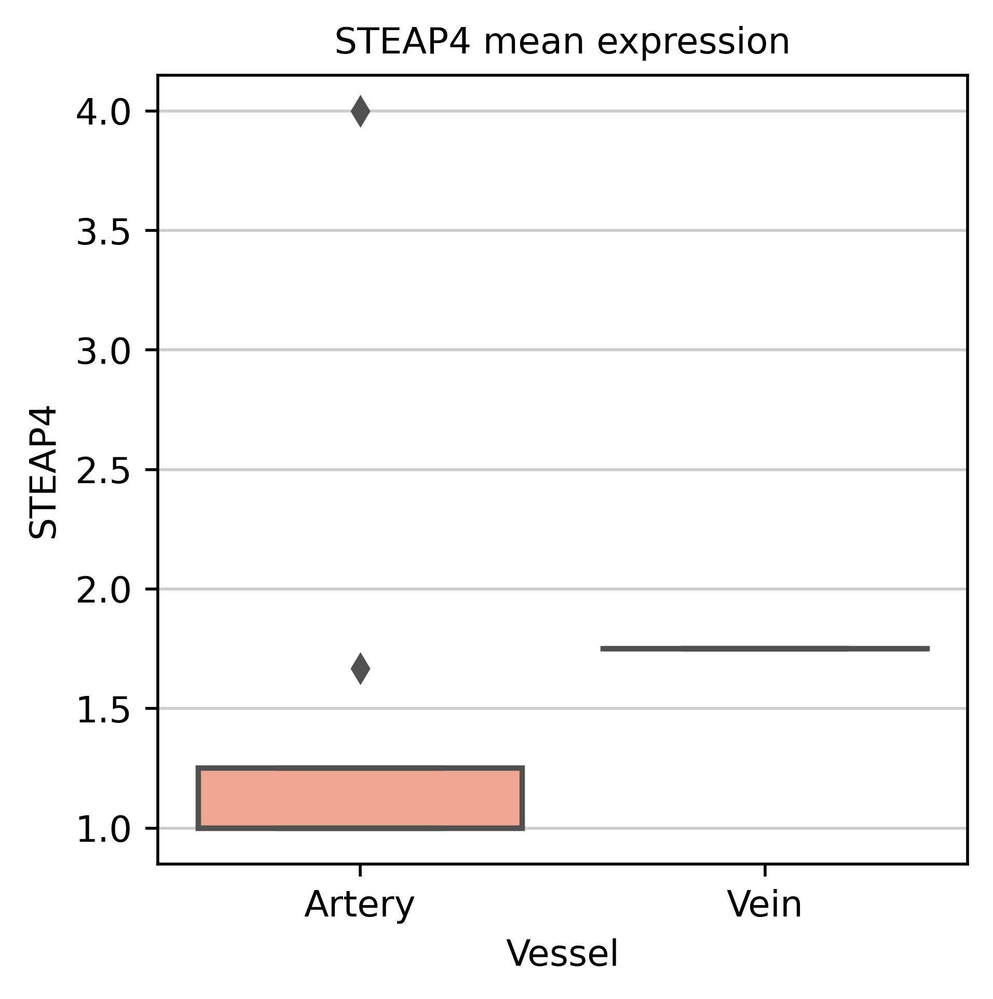

In [114]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [115]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_B1-4_13,0.000000,0.000000,0.000000,0.000000,0.625000,0.000000,0.0,NaN,NaN,NaN,3.200000,NaN,1.00,NaN,5.000000,NaN,Unclear,B1-4
ROI_B1-4_130,0.551724,0.379310,0.206897,0.137931,0.586207,0.172414,0.0,2.000000,4.000000,1.666667,2.529412,1.250000,1.00,NaN,1.500000,1.0,Artery,B1-4
ROI_B1-4_14,0.000000,0.166667,0.083333,0.250000,0.750000,0.000000,0.0,NaN,1.000000,2.000000,2.111111,1.333333,1.00,NaN,2.818182,NaN,Capillary,B1-4
ROI_B1-4_17,0.235294,0.176471,0.058824,0.117647,0.882353,0.000000,0.0,1.750000,1.333333,1.000000,2.666667,1.000000,1.50,NaN,1.333333,NaN,Aartery,B1-4
ROI_B1-4_18,0.440000,0.160000,0.260000,0.080000,0.720000,0.020000,0.0,2.090909,1.250000,1.615385,3.861111,1.000000,1.25,NaN,1.600000,NaN,Artery,B1-4
ROI_B1-4_28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,B1-4
ROI_B1-4_29,0.166667,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,1.000000,1.500000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN,Unclear,B1-4
ROI_B1-4_30,0.580645,0.096774,0.064516,0.064516,0.709677,0.032258,0.0,2.111111,1.666667,1.500000,4.772727,1.000000,1.00,NaN,1.500000,NaN,Artery,B1-4
ROI_B1-4_31,0.560000,0.040000,0.080000,0.040000,0.800000,0.000000,0.0,1.500000,1.000000,1.000000,4.300000,1.000000,1.00,NaN,1.500000,NaN,Artery,B1-4
ROI_B1-4_32,0.333333,0.166667,0.166667,0.166667,0.500000,0.000000,0.0,2.000000,1.000000,7.000000,1.666667,1.000000,1.00,NaN,1.000000,NaN,Artery,B1-4
